In [1]:
import copy
import os
import sys
import matplotlib.pyplot as plt
from data_utils.utils import keypoints_to_xy, get_iid_to_ann, load_ann, load_img, paths
from data_utils.coco_visualize import visualize_image_annotations2 as show_annotations2

sys.path.append('../models/de_potr')
from coco_dataset.coco_dataset import COCODataset, COCODatasetPredict, get_final_preds, get_affine_transform, affine_transform

In [2]:
images_path = paths["train_img"]
train_ann_path = paths["train_ann"]
val_ann_path = paths["val_ann"]

output_path = "data/output/visualization/aproaches"

In [3]:
train_ann = load_ann(train_ann_path)
val_ann = load_ann(val_ann_path)

iid_to_ann, iid_to_idx = get_iid_to_ann(val_ann_path, train_ann_path)

In [4]:
dataset_ann = train_ann
#dataset_ann = val_ann

max_area_ratio = 2     # max diference in bb sizes
min_img_bb_ratio = 7   # bb size in respect to image %
max_img_ratio = 1.4    # square images

_area_ratio = False
_img_bb_ratio = False
_no_overlap = False
_img_ratio = False

iids = []
for i in iid_to_ann:
    if len(iid_to_ann[i]) == 2:

        area_ratio = _area_ratio
        img_bb_ratio = _img_bb_ratio
        no_overlap = _no_overlap
        img_ratio = _img_ratio

        area1 = iid_to_ann[i][0]['area']
        area2 = iid_to_ann[i][1]['area']

        if area1 > area2:
            ratio = area1/area2
        else:
            ratio = area2/area1
        if ratio < max_area_ratio:
            area_ratio = True


        img_idx = iid_to_idx[i]
        w = dataset_ann['images'][img_idx]['width']
        h = dataset_ann['images'][img_idx]['height']

        if area1/(w*h) > min_img_bb_ratio/100:
            img_bb_ratio = True

        x00 = iid_to_ann[i][0]['bbox'][0]
        x01 = iid_to_ann[i][0]['bbox'][2] + x00
        x10 = iid_to_ann[i][1]['bbox'][0]
        x11 = iid_to_ann[i][1]['bbox'][2] + x10
        if x01 > x11:
            if x11 < x00:
                no_overlap = True
        else:
            if x01 < x10:
                no_overlap = True


        if w > h:
            if w/h < max_img_ratio:
                img_ratio = True
        else:
            if h/w < max_img_ratio:
                img_ratio = True

        if area_ratio and img_bb_ratio and not no_overlap and img_ratio:
            iids.append(i)

print(len(iids))

875


In [5]:
image_ids = [372764, 476894]
image_names = [f"{str(iid).zfill(12)}.jpg" for iid in image_ids]
ann = []
ann_transformed = {}
crop_imgs = {}
imgs = {}

for i in range(len(image_ids)):
    crop_imgs[image_ids[i]] = []
    ann_transformed[image_ids[i]] = []
    ann.extend(iid_to_ann[image_ids[i]])
    imgs[image_ids[i]] = load_img(images_path, image_names[i])

data = COCODatasetPredict(ann, imgs)

for i in range(len(data)):
    img, meta = data[i]
    iid = meta["image_id"]
    crop_imgs[iid].append(img)

    image_size = [meta["width"], meta["height"]]
    trans = get_affine_transform(meta["center"], meta["scale"], 0, image_size)

    xy = keypoints_to_xy(ann[i]["keypoints"])
    xy_t = copy.deepcopy(xy)
    for j, joint in enumerate(xy):
        xy_t[j] = affine_transform(joint, trans)

    ann_transformed[iid].append(xy_t)

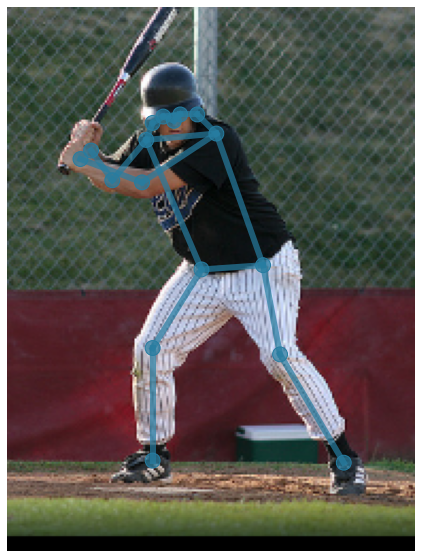

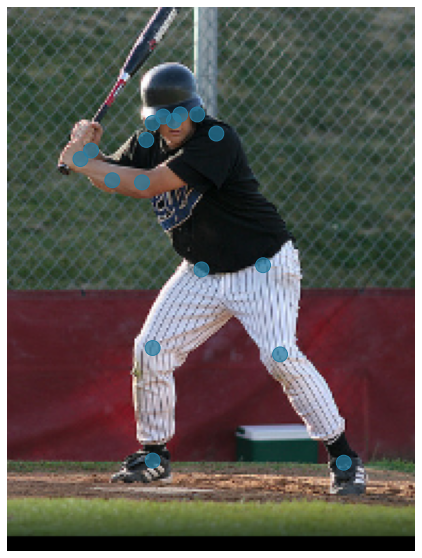

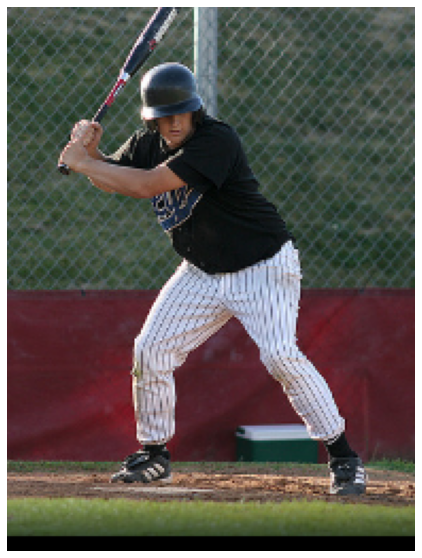

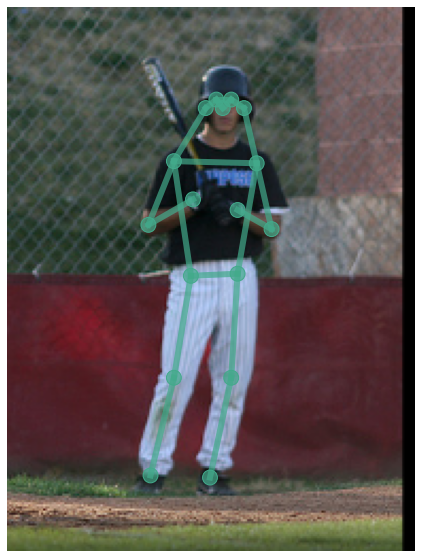

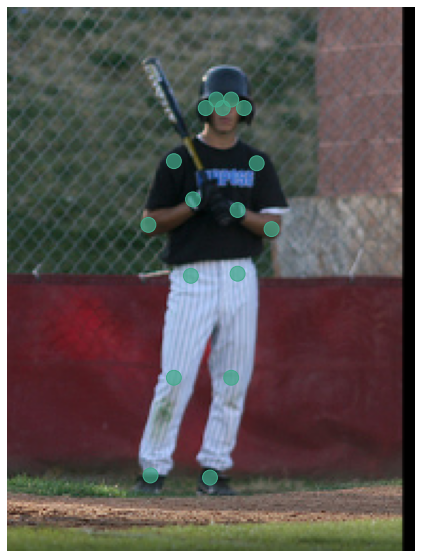

...

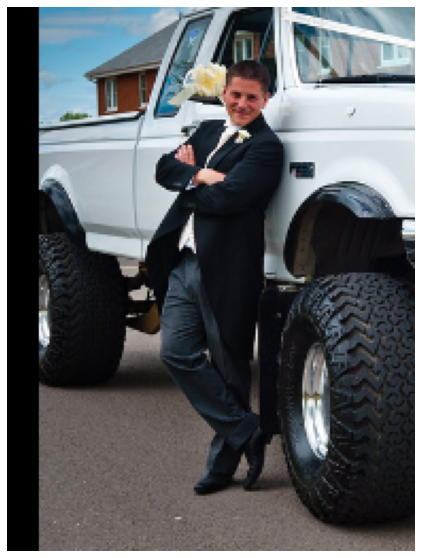

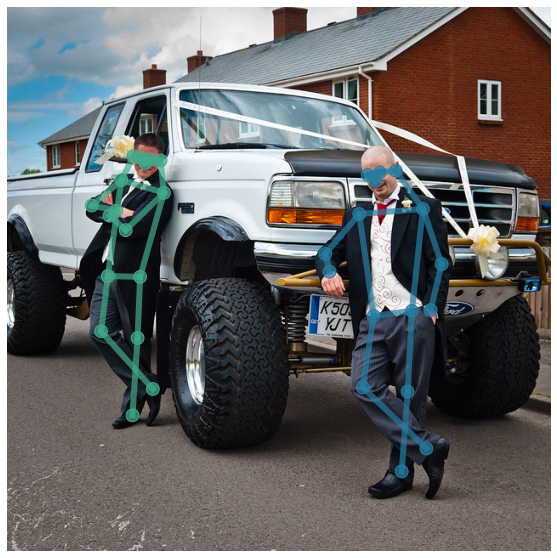

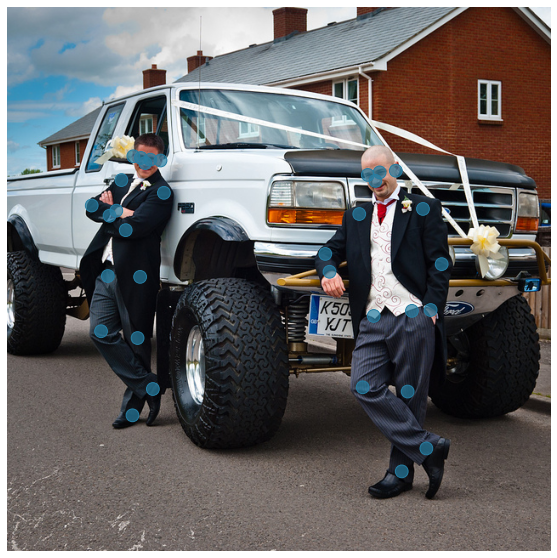

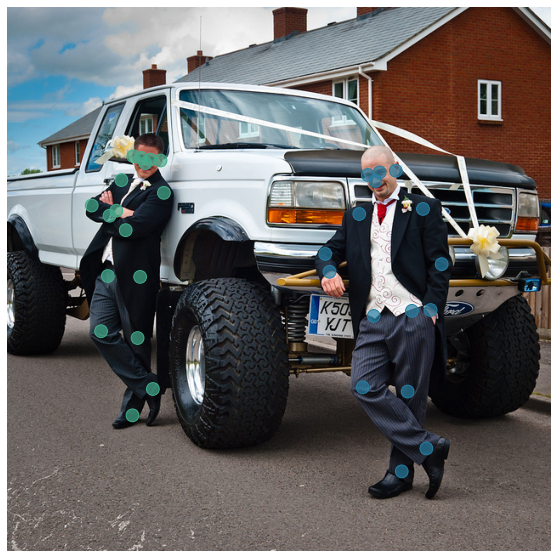

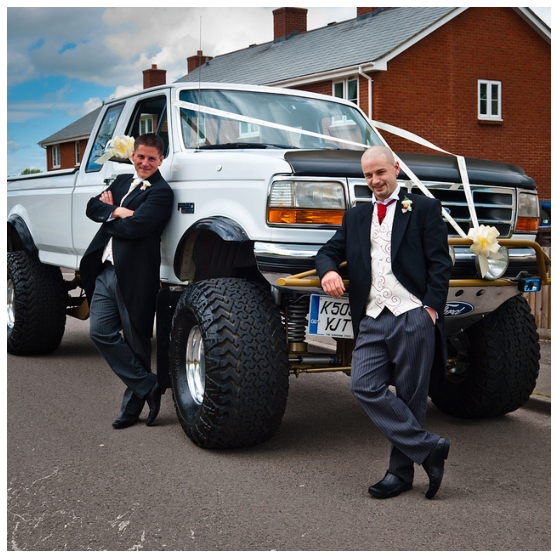

In [6]:
jnt_r = 3.5
cnc_w = 6
colors_c = [
    [39/255, 125/255, 161/255],
    [67/255, 170/255, 139/255]
]

for iid in image_ids:
    im_c = crop_imgs[iid]
    im_o = imgs[iid]
    kp_c = ann_transformed[iid]
    kp_o = [keypoints_to_xy(a["keypoints"]) for a in iid_to_ann[iid]]

    for i in range(len(im_c)):
        show_annotations2(im_c[i], [kp_c[i]], alpha=0.7, joints_r=jnt_r, connectins_w=cnc_w, path=os.path.join(output_path, f'{iid}-crp{i}_kp_lines.pdf'), colors=[colors_c[i]])
        show_annotations2(im_c[i], [kp_c[i]], alpha=0.7, joints_r=jnt_r, connectins_w=cnc_w, connections=False, path=os.path.join(output_path, f'{iid}-crp{i}_kp_lines.pdf'), colors=[colors_c[i]])

        fig, ax = plt.subplots(nrows=1, ncols=1, frameon=False, figsize=(15, 10))
        ax.imshow(im_c[i])
        ax.set_axis_off()
        fig.savefig(os.path.join(output_path, f'{iid}-crp{i}.pdf'), bbox_inches='tight', dpi=300)

    show_annotations2(im_o, kp_o, alpha=0.7, joints_r=jnt_r+4, connectins_w=cnc_w, path=os.path.join(output_path, f'{iid}-full_kp_lines.pdf'), colors=colors_c)
    show_annotations2(im_o, kp_o, alpha=0.7, joints_r=jnt_r+4, connectins_w=cnc_w, connections=False, path=os.path.join(output_path, f'{iid}-full_kp_no_group.pdf'), colors=[colors_c[0], colors_c[0]])
    show_annotations2(im_o, kp_o, alpha=0.7, joints_r=jnt_r+4, connectins_w=cnc_w, connections=False, path=os.path.join(output_path, f'{iid}-full_kp.pdf'), colors=colors_c)

    fig, ax = plt.subplots(nrows=1, ncols=1, frameon=False, figsize=(15, 10))
    ax.imshow(im_o)
    ax.set_axis_off()
    fig.savefig(os.path.join(output_path, f'{iid}-full.pdf'), bbox_inches='tight', dpi=300)